# Buildmodel

Build nonlinear time series models from scalar time series data using minimum description length radila basis function formalism

## Sample data

First we generate some typical test data to play with

In [1]:
include("ChaosFunctions.jl")

addnoise (generic function with 1 method)

In [2]:
using Plots

In [3]:
z=lorenzpoints(5000,0.05)

3×5001 Array{Float64,2}:
 -9.3954   -9.11588  -8.65294  -8.14648  …   0.348011  -0.90338  -1.72562
 -9.09342  -8.3313   -7.63451  -7.18491     -2.88828   -2.83896  -3.19333
 28.5537   28.7701   28.4925   27.8354      24.9674    21.8964   19.3518

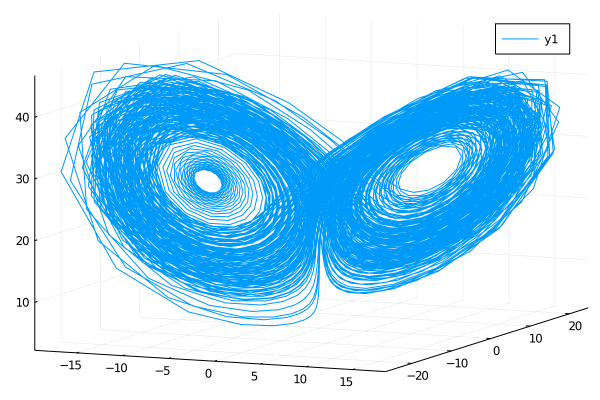

In [4]:
plot(z[1,:],z[2,:],z[3,:])

In [5]:
z=rosslerpoints(5000,0.2)

3×5001 Array{Float64,2}:
 -2.09051    -1.75877    -1.34197   …  -0.459284  -1.49662   -2.20517
 -1.45337    -1.90718    -2.303         3.23109    3.15526    2.90361
  0.0252208   0.0261013   0.027361      3.509      0.936751   0.227118

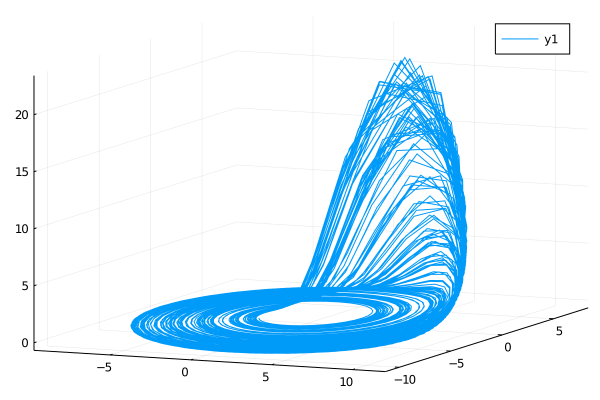

In [6]:
plot(z[1,:],z[2,:],z[3,:])

In [7]:
z=itmap(tinkerbell,-[0.7, 0.6],10000)

2×10000 Array{Float64,2}:
 -0.106024  -0.00524985   0.0848639  …  -0.0789416  -0.43416   -0.148745
 -0.407701  -0.329446    -0.171764      -0.978687   -0.492709  -0.686846

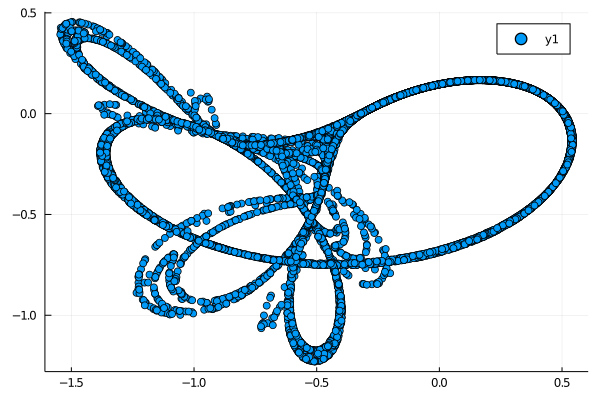

In [8]:
plot(z[2,:],z[1,:],linetype=:dots)

In [9]:
zn=addnoise(z,0.05)

2×10000 Array{Float64,2}:
 -0.114779   0.00475019   0.076984  …  -0.112634  -0.420884  -0.156736
 -0.41996   -0.310929    -0.202868     -0.941695  -0.4861    -0.676493

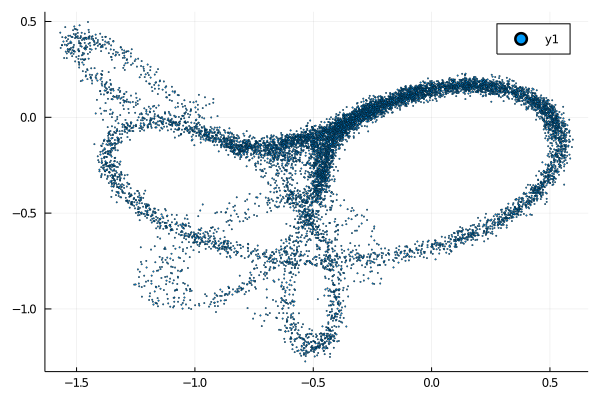

In [10]:
plot(zn[2,:],zn[1,:],linetype=:dots,markersize=1,markerstrokewidth=0.5)

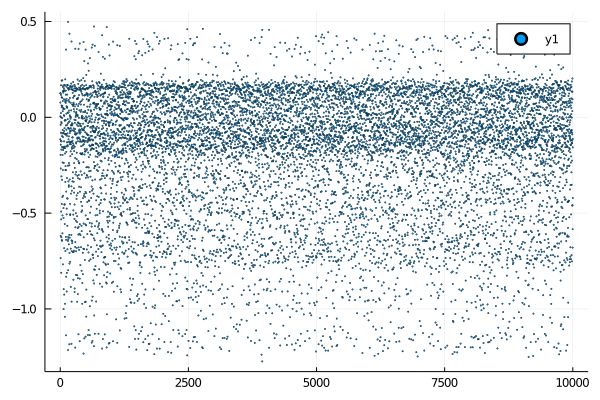

In [11]:
plot(zn[1,:],linetype=:dots,markersize=1,markerstrokewidth=0.5)

In [12]:
z=itmap(logistic,1/π,10^4);

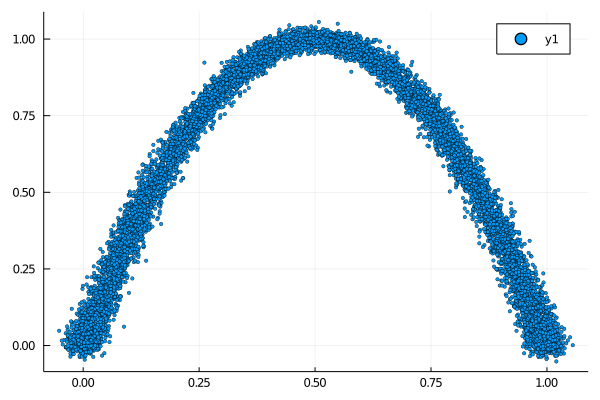

In [13]:
z=itmap(logistic,1/π,10^4);
zn=addnoise(z,0.05)
plot(zn[1:end-1],zn[2:end],linetype=:dots,markersize=2,markerstrokewidth = 0.5)

## Build the model

Import the modelling code, and away we go.

In [14]:
include("BasisFunctionTypes.jl")
include("Place.jl")

Main.Place

Any valid inline function can be used as a penlaty function (it must operate on globally defined functions in `Place.topdown` and must return a scalar, the algorithm seeks a minimum of this function. Four useful examples follow (description length ala `Rissanen` requires extra computation in the main code to account for parameter precisions.

In [15]:
#need to make these variables in scope of the current WS
nx=Int64(length(z))
mss=Float64(Inf)
λ=Array{Float64,1}[]
δ=Array{Float64,1}[]
#valid penalty criteria
Schwarz = :(nx*log(mss)+nk*log(nx))
Akaike = :(nx*log(mss)+2*nk)
Rissanen = :(description(mss,λ,δ,nx)) #Rissanen desciption length
Model30 = :(-nk*(nk<=30))
#nx is # of observation (length of data)
#nk is # of parameters (basis functions in model)
#mss is the mean-sum-square model prediction error
#λ are the model parameters and δ their precisions

:(-nk * (nk <= 30))

Next, the dictionary `options` defined model structure and optional modelling parameters (it'll run a produce something even if `options` is empty, but it might be better to populate this somewhat intelligently. A useful example to model the (admittedly rather simple) logistic map is provided

In [16]:
options=Dict("stopstep"=>10,
    "testdatum"=> 8000,
    "functions"=> (gaussian,tophat),
    "embedding" => Place.vembed([0,1,2,3]),
 #   "embedding" => ([0, 1], [0, 1, 2, 3]),
    "penalty"=> Rissanen,
    "nneighbours"=> 1
    )

Dict{String,Any} with 6 entries:
  "penalty"     => :(description(mss, λ, δ, nx))
  "stopstep"    => 10
  "embedding"   => ([0], [1], [0, 1], [2], [0, 2], [1, 2], [0, 1, 2], [3], [0, …
  "testdatum"   => 8000
  "functions"   => (gaussian, tophat)
  "nneighbours" => 1

And, then, away we go...

In [17]:
mymodel, X, zout, mdlv = Place.buildmodel(zn,options)

dx=4, nx=7999
needδ=true
*MSS=0.12391234943079918 DL=3002.900583452234 size=1
*MSS=0.015794348228616643 DL=-5234.839137465191 size=1
WARNING Qδ=1/δ has no exact solution in 2-D case - giving up
*MSS=0.012511830064771266 DL=-6160.960162554962 size=2
*MSS=0.00420656641337894 DL=-10511.686360834137 size=3
*MSS=0.0038479932367079246 DL=-10859.101499862509 size=4
*MSS=0.003602404004685499 DL=-11116.067919162017 size=5
*MSS=0.003384827162429444 DL=-11357.821628582895 size=6
*MSS=0.0031433765427875903 DL=-11646.727971966302 size=7
*MSS=0.0031188758725604485 DL=-11677.967201360363 size=7
*MSS=0.0029478126519605873 DL=-11903.546655976692 size=7
*MSS=0.0029247426519389145 DL=-11928.688218480236 size=8
*MSS=0.0028899181867698526 DL=-11976.159881070504 size=8
*MSS=0.002863187312861513 DL=-12006.234088318155 size=9
MSS=0.0028664944765150117 DL=-12001.863873171322 size=9
*MSS=0.0028385282973045992 DL=-12034.355780927315 size=10
*MSS=0.0027253716163018055 DL=-12196.044911468513 size=10
MSS=0.00274316

(Main.Place.PlaceModel(Main.Place.BasisFunc[Main.Place.BasisFunc(tophat, [0], 0.40773450687100754, [0.45031590590376597 0.9088077458275617 … 0.5415697787926341 0.06611884742161953], [3.6571705859284878]), Main.Place.BasisFunc(tophat, [1], 0.24535689396046506, [0.8980474848108398 0.34195012834200944 … 0.15038271278914744 0.9885989390242746], [2.4952906319578645]), Main.Place.BasisFunc(tophat, [1], 0.13005592383724532, [0.8980474848108398 0.34195012834200944 … 0.15038271278914744 0.9885989390242746], [3.614596320475066]), Main.Place.BasisFunc(tophat, [0], 0.19974301973232658, [0.45031590590376597 0.9088077458275617 … 0.5415697787926341 0.06611884742161953], [2.6015010430195717]), Main.Place.BasisFunc(tophat, [1], 0.5306738248014153, [0.8980474848108398 0.34195012834200944 … 0.15038271278914744 0.9885989390242746], [4.500796751563966]), Main.Place.BasisFunc(gaussian, [0, 1], 0.14367972158123768, [0.45031590590376597 0.9088077458275617 … 0.5415697787926341 0.06611884742161953; 0.8980474848

Modelling done, we can make one-step predictions on time series data

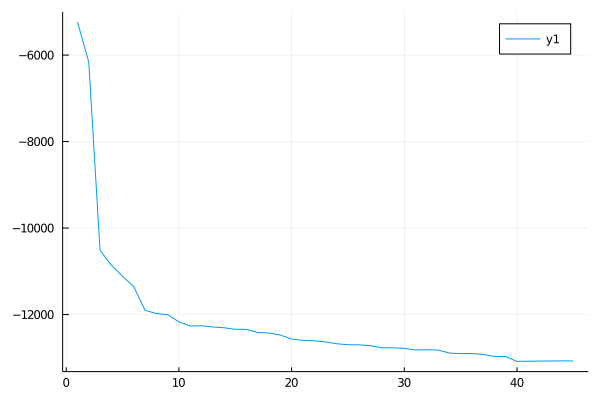

In [18]:
plot(mdlv)

In [19]:
yt,yp,ep = Place.predict(mymodel, z);

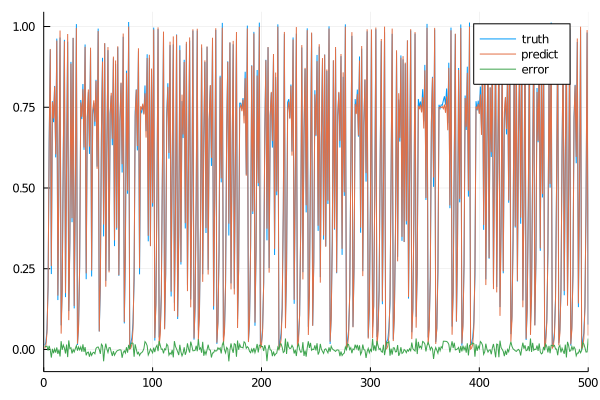

In [20]:
plot(yt,label="truth")
plot!(yp,label="predict")
plot!(ep,label="error",xlimit=(0,500))

Or, free run simulations

In [21]:
yp, yt = Place.freerun(mymodel,zn,500)

([0.008608500560035814, 0.030099718140717324, 0.10655255925482165, 0.371155135328528, 0.9283018102154403, 0.27410519853179544, 0.7736551851756823, 0.7048339156129669, 0.8435490203905187, 0.5202880086438413  …  0.1255855782244119, 0.43268897298864306, 0.9758786306851978, 0.11050921401366731, 0.36007976357845406, 0.9360869908185413, 0.24580993534966333, 0.722657701309263, 0.8086251983549474, 0.6009669711987482], [-0.01511959226273151, 0.00755689647509733, 0.06249831925711807, 0.2011137670699735, 0.6308718198435226, 0.9466014899832006, 0.2529050051891667, 0.7559522531968547, 0.7154625565946062, 0.8027954114676499  …  0.15147762526289313, 0.4993094893119091, 1.0085544526166028, -0.004761924343195133, -0.033429174497949986, 0.05157976852141197, 0.13143160811103863, 0.45467566099315765, 0.9897887218512417, 0.04758827509913876])

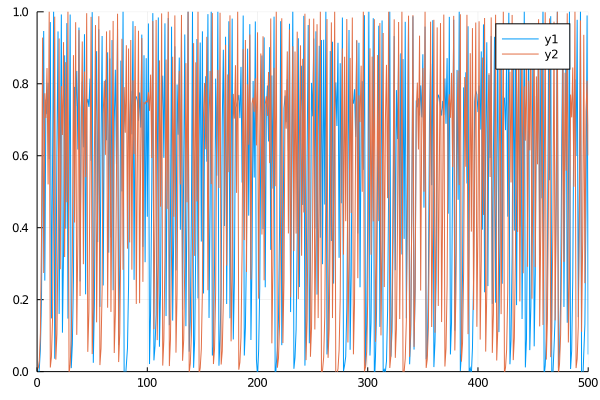

In [22]:
plot(yt)
plot!(yp,ylimit=(0,1),xlimit=(0,500))


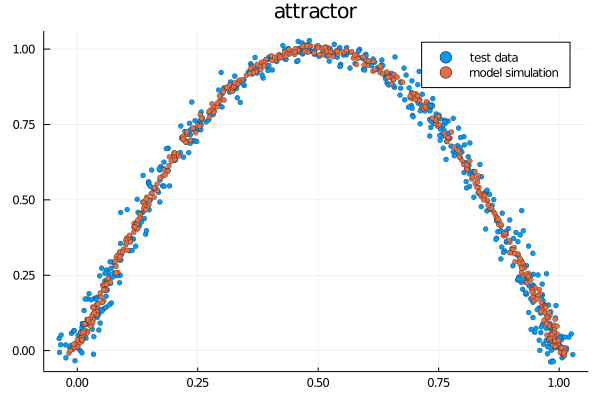

In [23]:
plot(yt[1:end-1],yt[2:end],linetype=:dots,markersize=3,markerstrokewidth = 0.3,label="test data")
plot!(yp[1:end-1],yp[2:end],linetype=:dots,markersize=3,markerstrokewidth = 0.3,label="model simulation",title="attractor")

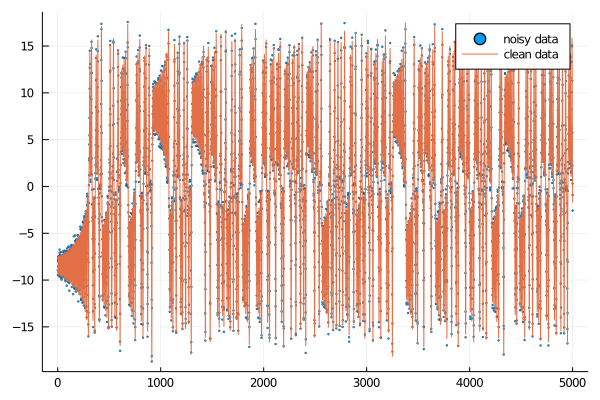

In [24]:
z=lorenzpoints(5000,0.05)
y=z[1,:]
yn=addnoise(y,0.05)
plot(yn,linetype=:dots,markersize=1.2,markerstrokewidth = 0.3,label="noisy data")
plot!(y,label="clean data")

In [25]:
options=Dict("stopstep"=>10,
    "testdatum"=> 8000,
    "functions"=> (gaussian,tophat),
    "embedding" => Place.vembed([0,1,2,3,6,12]),
 #   "embedding" => ([0, 1], [0, 1, 2, 3]),
    "penalty"=> Rissanen,
    "nneighbours"=> 1
    )

Dict{String,Any} with 6 entries:
  "penalty"     => :(description(mss, λ, δ, nx))
  "stopstep"    => 10
  "embedding"   => ([0], [1], [0, 1], [2], [0, 2], [1, 2], [0, 1, 2], [3], [0, …
  "testdatum"   => 8000
  "functions"   => (gaussian, tophat)
  "nneighbours" => 1

In [26]:
mymodel, X, zout, mdlv = Place.buildmodel(yn,options)

dx=13, nx=4488
needδ=true
*MSS=4.615049240217632 DL=9803.986855171655 size=1
WARNING Qδ=1/δ has no exact solution in 2-D case - giving up
*MSS=3.0537269199507393 DL=8882.315897398914 size=2
*MSS=2.723949177372368 DL=8631.544208651616 size=3
*MSS=2.6669562455231306 DL=8589.394506539511 size=4
*MSS=2.6242594604374525 DL=8558.851135644698 size=5
*MSS=1.5740622531544783 DL=7413.970385403493 size=5
*MSS=1.3976793471659865 DL=7146.140438171378 size=5
*MSS=1.3897615903640037 DL=7139.41588246119 size=6
*MSS=1.3037306781981042 DL=6994.862726658319 size=6
*MSS=1.2942427643257572 DL=6984.466428700063 size=7
*MSS=1.288668933777502 DL=6974.608592404737 size=7
MSS=1.287006010940886 DL=6978.569372839302 size=8
*MSS=1.2297404218861607 DL=6873.02990861656 size=8
MSS=1.2291369018938558 DL=6878.794167122953 size=9
*MSS=1.0534703012654882 DL=6532.944897384051 size=9
*MSS=0.8011432338705008 DL=5919.328532158243 size=9
MSS=0.799426312670806 DL=5921.733535670439 size=10
*MSS=0.7144260696385147 DL=5669.189304

(Main.Place.PlaceModel(Main.Place.BasisFunc[Main.Place.BasisFunc(tophat, [2, 3], 4.514183326772902, [7.058194183727932 -5.11653265356349 … -6.9216988701011255 -9.681193570659; 6.210469840820382 -2.68717374849265 … -4.367308093552282 -6.568241838767682], [4.271735304598009]), Main.Place.BasisFunc(tophat, [1], 5.51196602683247, [8.403353632601535 -8.511194955780562 … -11.529797964042595 -14.904959691773005], [4.5479814166881125]), Main.Place.BasisFunc(tophat, [1, 6], 7.794622426289819, [8.403353632601535 -8.511194955780562 … -11.529797964042595 -14.904959691773005; 6.573285603393523 -0.44990229693153283 … -1.1901028556712847 -1.745389977141396], [3.9063023307588853]), Main.Place.BasisFunc(tophat, [0, 1], 13.933299289646307, [9.54224156415165 -12.412214561171806 … -16.798505342181937 -17.95421470635745; 8.403353632601535 -8.511194955780562 … -11.529797964042595 -14.904959691773005], [3.858800846909058]), Main.Place.BasisFunc(tophat, [3], 7.181346492379767, [6.210469840820382 -2.6871737484

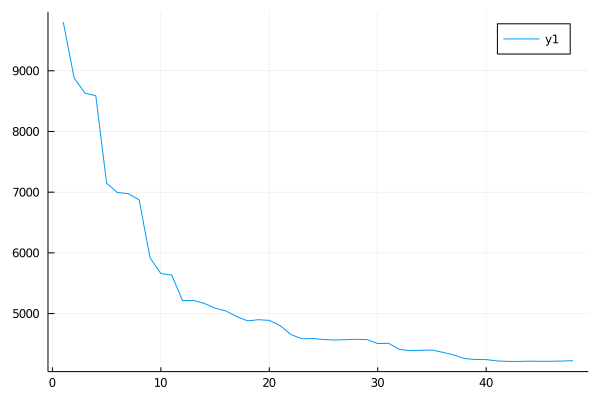

In [27]:
plot(mdlv)

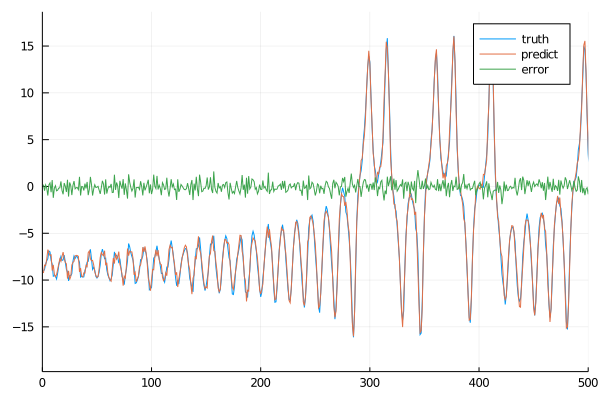

In [28]:
yt,yp,ep = Place.predict(mymodel, yn);
plot(yt,label="truth")
plot!(yp,label="predict")
plot!(ep,label="error",xlimit=(0,500))

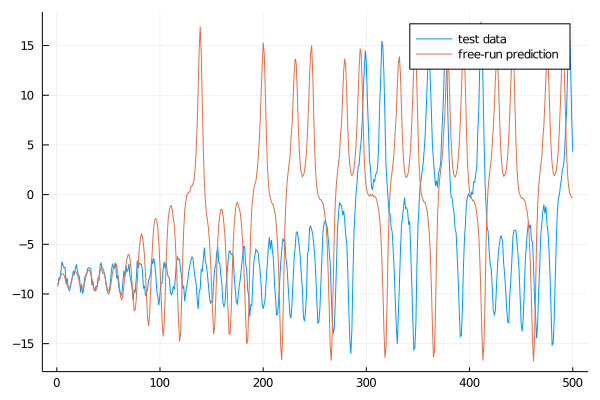

In [29]:
yp, yt = Place.freerun(mymodel,yn,500)
plot(yt,label="test data")
plot!(yp,label="free-run prediction")

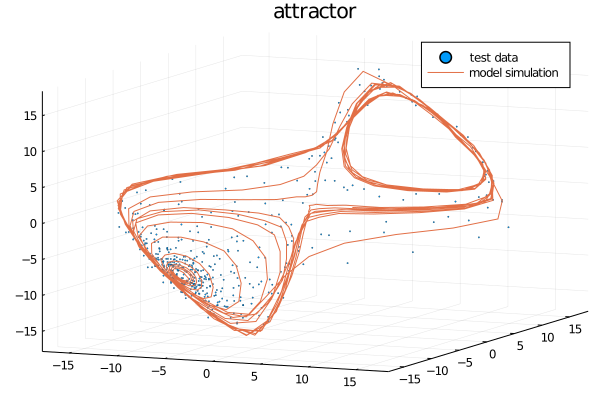

In [30]:
plot(yt[1:end-6],yt[4:end-3],yt[7:end],linetype=:dots,markersize=1,markerstrokewidth = 0.3,label="test data")
plot!(yp[1:end-6],yp[4:end-3],yp[7:end],label="model simulation",title="attractor")

## Michael Small

Last updated today ... 6/4/21